## 행렬을 영상파일로 저장

In [3]:
import cv2

image = cv2.imread("./chap04/images/read_color.jpg", cv2.IMREAD_COLOR)
if image is None: raise Exception("영상 파일 읽기 에러")
    
params_jpg = (cv2.IMWRITE_JPEG_QUALITY, 10)        # 예외처리
params_png = [cv2.IMWRITE_JPEG_QUALITY, 9]         # PNG 압축 레벨 설정

## 행렬을 영상 파일로 저장
cv2.imwrite("./chap04/images/write_test10.jpg", image)       # 디폴트는 95
cv2.imwrite("./chap04/images/write_test20.jpg", image, params_jpg)     # 지정한 화질로 저장
cv2.imwrite("./chap04/images/write_test30.png", image, params_png)
cv2.imwrite("./chap04/images/write_test40.bmp", image)         # BMP 파일로 저장 
print("저장 완료")

저장 완료


## 카메라에서 프레임 읽기 

In [2]:
import cv2

def put_string(frame, text, pt, value, color=(120, 200, 90)):             # 문자열 출력 함수 - 그림자 효과
    text += str(value)
    shade = (pt[0] + 2, pt[1] + 2)
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(frame, text, shade, font, 0.7, (0, 0, 0), 2)  # 그림자 효과
    cv2.putText(frame, text, pt, font, 0.7, (120, 200, 90), 2)  # 글자 적기

capture = cv2.VideoCapture(0)  # 0번 카메라 연결
if capture.isOpened() == False:
    raise Exception("카메라 연결 안됨")

# 카메라 속성 획득 및 출력
print("너비 %d" % capture.get(cv2.CAP_PROP_FRAME_WIDTH))
print("높이 %d" % capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
print("노출 %d" % capture.get(cv2.CAP_PROP_EXPOSURE))
print("밝기 %d" % capture.get(cv2.CAP_PROP_BRIGHTNESS))

while True:  # 무한 반복
    ret, frame = capture.read()
    if not ret: break
    if cv2.waitKey(0) >= 0 : break

    exposure = capture.get(cv2.CAP_PROP_EXPOSURE)
    put_string(frame, 'EXPOS: ', (10, 40), exposure)
    title = "View Frame from Camera"
    cv2.imshow(title, frame)  # 윈도우에 영상 띄우기
capture.release()

너비 640
높이 480
노출 -6
밝기 128


: 

## 비디오 처리

In [ ]:
# 문자열 출력 함수 - 그림자 효과
import numpy as np, cv2, time
def put_string(frame, text, pt, value=None, color=(120, 200, 90)) :
    text = str(text) + str(value)
    shade = (pt[0] + 2, pt[1] + 2)
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(frame, text, shade, font, 0.7, (0, 0, 0), 2) # 그림자 효과
    cv2.putText(frame, text, pt   , font, 0.7, color, 2) # 작성 문자

In [8]:
import cv2

capture = cv2.VideoCapture("./chap04/images/move_file.avi")		# 동영상 파일 개방
if not capture.isOpened(): raise Exception("동영상 파일 개방 안됨")		# 예외 처리

frame_rate = capture.get(cv2.CAP_PROP_FPS)           		# 초당 프레임 수
delay = int(1000 / frame_rate)                         		# 지연 시간
frame_cnt = 0                                       		# 현재 프레임 번호

while True:
	ret, frame = capture.read()
	if not ret or cv2.waitKey(delay) >= 0 : break  # 프레임 간 지연 시간 지정
	blue, green, red = cv2.split(frame)
	frame_cnt += 1
	
	if 100 <= frame_cnt < 200 : cv2.add(blue, 100, blue)
	elif 200 <= frame_cnt < 300 : cv2.add(green, 100, green)
	elif 300 <= frame_cnt < 400 : cv2.add(red, 100, red)
	
	frame = cv2.merge( [blue, green, red] )                 # 단일채널 영상 합성
	put_string(frame, "frame_cnt : ", (20, 320), frame_cnt)
	cv2.imshow("Read Video File", frame)

capture.release()

: 

## 연습문제 1번
PC 카메라를 통해 받아온 프레임에 다음의 영상처리를 수행하고, 결과 영상을 윈도우에 표시하는 프로그램을 작성하시오
- (200, 100)좌표에서 100X200 크기의 관심 영역 지정
- 관심 영역에서 녹색 성분을 50만큼 증가
- 관심 영역의 테두리를 두께 3의 빨간색으로 표시


In [9]:
import cv2
import numpy as np

# 카메라 캡처 함수
cap = cv2.VideoCapture(0)

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # 관심 영역 (area) 설정
    x, y, w, h = 200, 100, 100, 200 # 200, 100
    area = frame[y:y+h, x:x+w]

    # 녹색 성분 증가
    area[:, :, 1] = np.clip(area[:, :, 1] + 50, 0, 255)

    # 원본 이미지에 area 수정 내용 반영
    frame[y:y+h, x:x+w] = area

    # 관심 영역의 테두리에 빨간색 사각형 그리기
    cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 0, 255), 3)

    # 결과 이미지 표시
    cv2.imshow('image', frame)

    # q를 누르면 종료
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

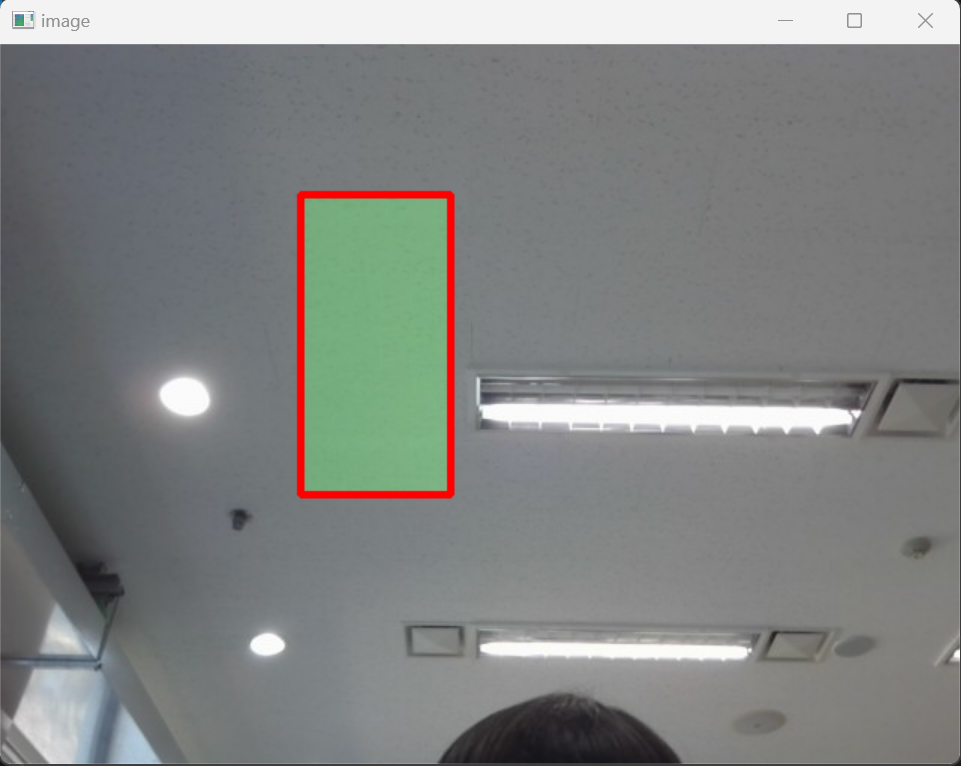

## 연습문제 2번
다음의 마우스 이벤트 제어 프로그램을 작성하시오
- 마우스 오른쪽 버튼 클릭 시 원(클릭 좌표에서 반지름 20화소)을 그린다
- 마우스 왼쪽 버튼 클릭 시 사각형(크기 30 x 30)을 그린다.
- 트랙바를 추가해서 선의 굵기를 1~10 픽셀로 조절한다.
- 트랙바를 추가해서 원의 반지름을 1~ 50픽셀로 조절한다

In [8]:
import numpy as np
import cv2

# 마우스 클릭 함수
def onMouse(event, x, y, flags, param):
    global radius, line_width
    if event == cv2.EVENT_LBUTTONDOWN: # 왼쪽 버튼 누르면 정사각형 그리기
        cv2.rectangle(image, (x, y), (x + 30, y + 30), (255, 255, 255), line_width) # 30 by 30 정사각형
        cv2.imshow(title, image)

    elif event == cv2.EVENT_RBUTTONDOWN: # 오른쪽 버튼 누르면 원 그리기
        cv2.circle(image, (x, y), radius, (255, 255, 255), line_width) # 마우스클릭 event좌표 중심으로 원그리기
        cv2.imshow(title, image)

# 트랙바 원 반지름 반환함수
def onChangeRadius(value):
    global radius
    radius = value

# 트랙바 선굵기 반환 함수
def onChangeLineWidth(value):
    global line_width
    line_width = value

image = np.zeros((300,500,3),np.uint8)
title = 'practice_2' #상태바 제목
cv2.imshow(title, image)

# 트랙바 초기값 설정
radius = 20
line_width = 1

# 트랙바 생성
cv2.createTrackbar('Radius', title, radius, 50, onChangeRadius)
cv2.createTrackbar('Line Width', title, line_width, 10, onChangeLineWidth)

cv2.setMouseCallback(title, onMouse)

cv2.waitKey(0)
cv2.destroyAllWindows()

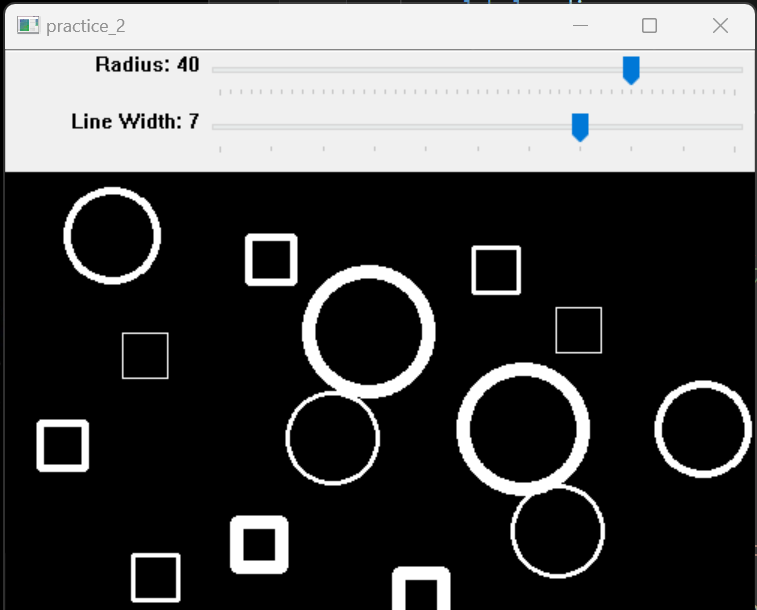

## 기본 배열 처리

In [4]:
import cv2

image = cv2.imread("./chap05/images/flip_test.jpg", cv2.IMREAD_COLOR)
if image is None: raise Exception("영상 파일 읽기 오류 발생") # 예외 처리

x_axis = cv2.flip(image, 0)  # x축 기준 상하 뒤집기
y_axis = cv2.flip(image, 1)  # y축 기준 좌우 뒤집기
xy_axis = cv2.flip(image, -1)
rep_image   = cv2.repeat(image, 1, 2)       # 반복 복사
trans_image = cv2.transpose(image)          # 행렬 전치

## 각 행렬을 영상으로 표시
titles = ['image', 'x_axis', 'y_axis','xy_axis','rep_image','trans_image']
for title in titles:
    cv2.imshow(title, eval(title))
cv2.waitKey(0) 
cv2.destroyAllWindows()

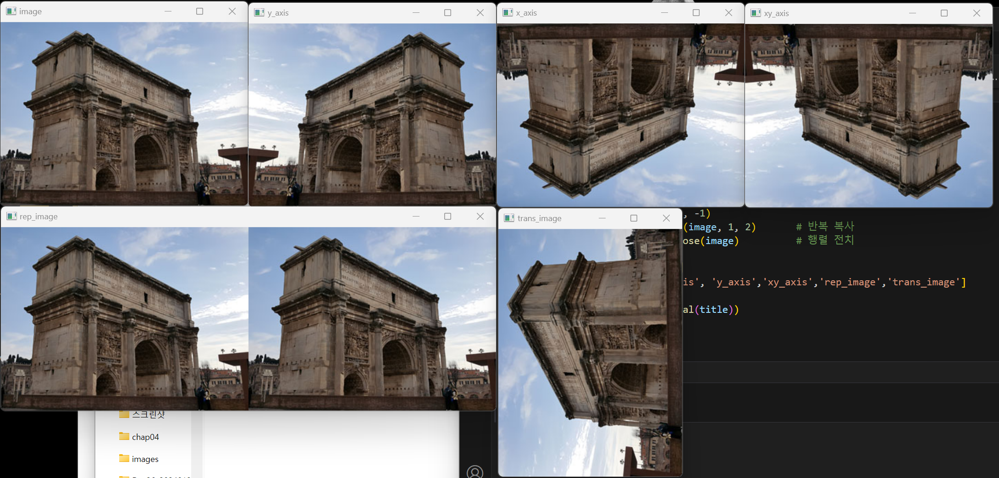

In [5]:
import numpy as np, cv2

m1 = np.full((3, 6), 10, np.uint8)			# 단일 채널 생성 및 초기화
m2 = np.full((3, 6), 50, np.uint8)
m_mask = np.zeros(m1.shape, np.uint8)		# 마스크 생성
m_mask[:,3:] = 1							# 관ㅅ미영역을 지정한 후 1을 할당

m_add1 = cv2.add(m1, m2)                    # 행렬 덧셈
m_add2 = cv2.add(m1, m2, mask=m_mask)       # 

# 행렬 나눗셈 수행
m_div1 = cv2.divide(m1, m2)
m1 = m1.astype(np.float32)
m2 = np.float32(m2)
m_div2 = cv2.divide(m1, m2)

titles = ['m1', 'm2', 'm_mask','m_add1','m_add2','m_div1', 'm_div2']
for title in titles:
    print("[%s] = \n%s \n" % (title, eval(title)))

[m1] = 
[[10. 10. 10. 10. 10. 10.]
 [10. 10. 10. 10. 10. 10.]
 [10. 10. 10. 10. 10. 10.]] 

[m2] = 
[[50. 50. 50. 50. 50. 50.]
 [50. 50. 50. 50. 50. 50.]
 [50. 50. 50. 50. 50. 50.]] 

[m_mask] = 
[[0 0 0 1 1 1]
 [0 0 0 1 1 1]
 [0 0 0 1 1 1]] 

[m_add1] = 
[[60 60 60 60 60 60]
 [60 60 60 60 60 60]
 [60 60 60 60 60 60]] 

[m_add2] = 
[[ 0  0  0 60 60 60]
 [ 0  0  0 60 60 60]
 [ 0  0  0 60 60 60]] 

[m_div1] = 
[[0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]] 

[m_div2] = 
[[0.2 0.2 0.2 0.2 0.2 0.2]
 [0.2 0.2 0.2 0.2 0.2 0.2]
 [0.2 0.2 0.2 0.2 0.2 0.2]] 



In [8]:
# 영상 최솟값 최댓값 연산 --> 화질 개선

import numpy as np, cv2

image = cv2.imread("./chap05/images/minMax.jpg", cv2.IMREAD_GRAYSCALE)
if image is None: raise Exception("영상 파일 읽기 오류 발생")

min_val, max_val, _, _ = cv2.minMaxLoc(image) # 최솟값과 최댓값 가져오기

ratio = 255/ (max_val - min_val)
dst = np.round((image - min_val) * ratio).astype('uint8')
min_dst, max_dst, _, _ = cv2.minMaxLoc(dst)

print("원본 영상 최솟값= %d , 최댓값= %d" % (min_val, max_val))
print("수정 영상 최솟값= %d , 최댓값= %d" % (min_dst, max_dst))
cv2.imshow("image", image)
cv2.imshow("dst"  , dst)
cv2.waitKey(0)
cv2.destroyAllWindows()

원본 영상 최솟값= 13 , 최댓값= 107
수정 영상 최솟값= 0 , 최댓값= 255


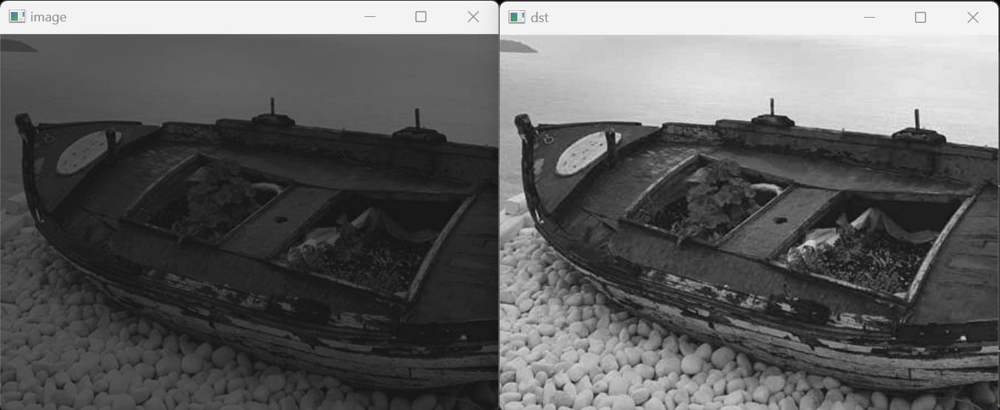

## 영상 합성

In [1]:
import numpy as np, cv2

image1 = cv2.imread("./chap06/images/add1.jpg", cv2.IMREAD_GRAYSCALE)   # 영상 읽기
image2 = cv2.imread("./chap06/images/add2.jpg", cv2.IMREAD_GRAYSCALE)
if image1 is None or image2 is None: raise Exception("영상 파일 읽기 오류 발생")

# 영상 합성
alpha, beta = 0.6, 0.7
add_img1 = cv2.add(image1, image2)
add_img2 = cv2.add(image1 * alpha, image2 * beta)
add_img2 = np.clip(add_img2, 0, 255).astype('uint8')
add_img3 = cv2.addWeighted(image1, alpha, image2, beta, 0)

titles = ['image1','image2','add_img1','add_img2','add_img3']
for t in titles: cv2.imshow(t, eval(t))
cv2.waitKey(0)
cv2.destroyAllWindows()

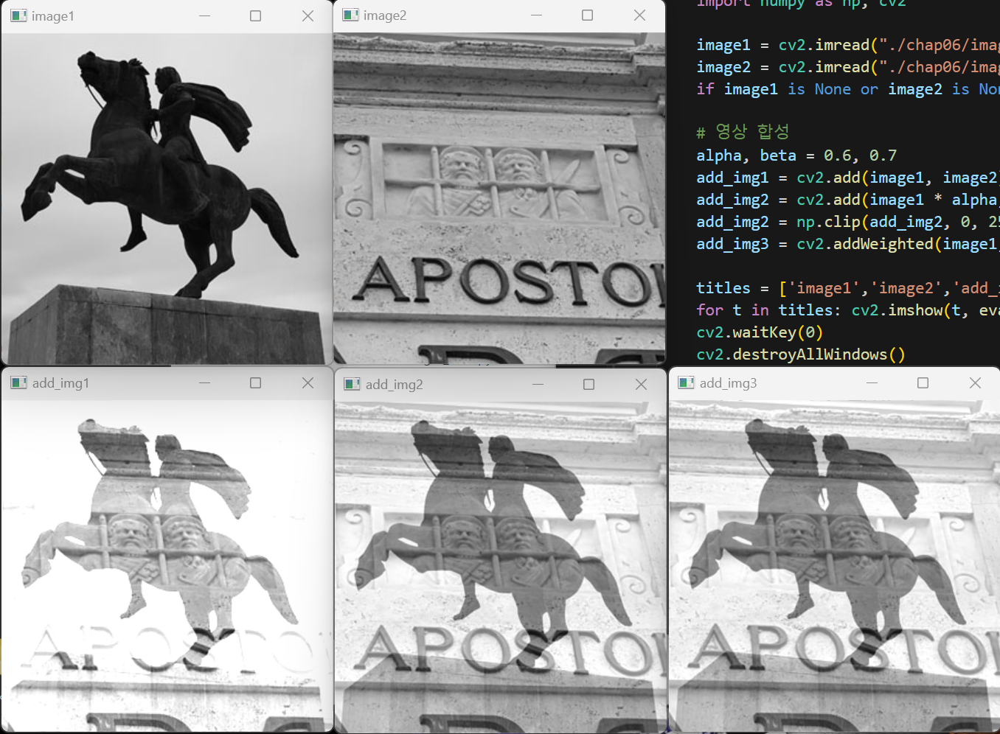

## 명암 대비

In [21]:
import numpy as np, cv2

image = cv2.imread("./chap06/images/contrast.jpg", cv2.IMREAD_GRAYSCALE)  # 영상 읽기
if image is None: raise Exception("영상 파일 읽기 오류 발생")

noimage = np.zeros(image.shape[:2], image.dtype)        # 더미 영상
avg = cv2.mean(image)[0]/2.0                            # 영상 화소 평균의 절반

dst1 = cv2.scaleAdd(image, 0.5, noimage)                # 명암 대비 감소
dst2 = cv2.scaleAdd(image, 2.0, noimage)                # 명암 대비 증가
dst3 = cv2.addWeighted(image, 0.5, noimage, 0, avg)     # 명암 대비 감소
dst4 = cv2.addWeighted(image, 2.0, noimage, 0, -avg)    # 명암 대비 증가

# 영상 띄우기
cv2.imshow("image", image)
cv2.imshow("dst1 - decrease contrast", dst1)
cv2.imshow("dst2 - increase contrast", dst2)
cv2.imshow("dst3 - decrease contrast using average", dst3)
cv2.imshow("dst4 - increase contrast using average", dst4)

cv2.imwrite("dst.jpg",dst1)
cv2.waitKey(0)
cv2.destroyAllWindows()

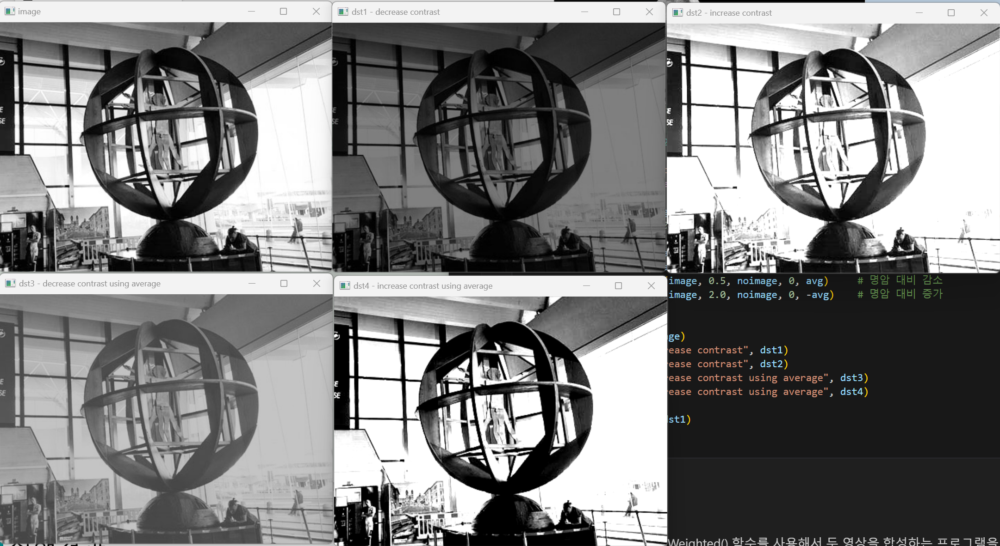

## 연습문제1
OpenCv함수 중에서 cv2.addWeighted() 함수를 사용해서 두 영상을 합성하는 프로그램을 작성하시오

In [19]:
import numpy as np
import cv2

image1 = cv2.imread("./chap06/images/add1.jpg", cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread("./chap06/images/add2.jpg", cv2.IMREAD_GRAYSCALE)
if image1 is None or image2 is None:
    raise Exception("영상 파일 읽기 오류 발생")

# 영상 합성
alpha, beta = 0.5, 0.5
#add_img1 = cv2.add(image1 * alpha, image2 * beta)
add_img1 = cv2.addWeighted(image1, alpha, image2, beta, 0)
add_img1 = np.clip(add_img1, 0, 255).astype("uint8")

combined_images = np.hstack((image1, add_img1, image2))

cv2.imshow('Combined Images', combined_images)
cv2.waitKey(0)
cv2.destroyAllWindows()


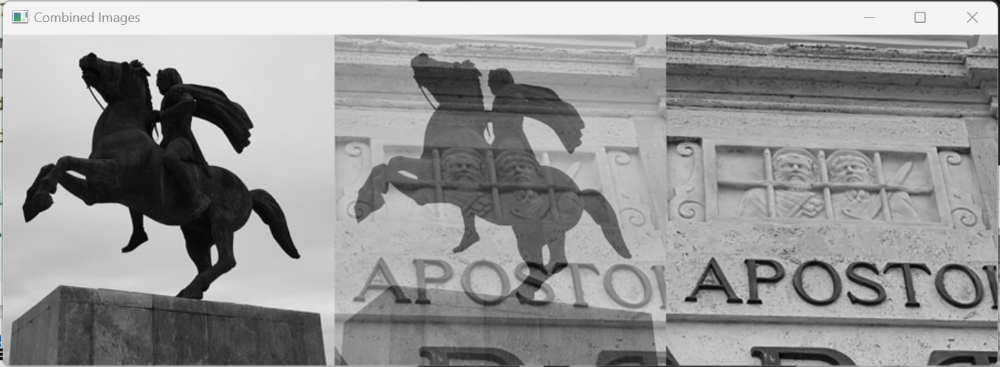

## 히스토그램을 이용한 화소

In [25]:
import cv2

BGR_img = cv2.imread("./chap06/images/color_space.jpg", cv2.IMREAD_COLOR) # 컬러 영상 읽기
if BGR_img is None: raise Exception("영상 파일 읽기 오류")
    
Gray_img = cv2.cvtColor(BGR_img, cv2.COLOR_BGR2GRAY)
YCC_img = cv2.cvtColor(BGR_img, cv2.COLOR_BGR2YCrCb)
YUV_img = cv2.cvtColor(BGR_img, cv2.COLOR_BGR2YUV)
LAB_img = cv2.cvtColor(BGR_img, cv2.COLOR_BGR2LAB)

YCC_ch = cv2.split(YCC_img)
YUV_ch = cv2.split(YUV_img)
LAB_ch = cv2.split(LAB_img)

cv2.imshow("BGR_img", BGR_img)
cv2.imshow("Gray_img", Gray_img)

sp1, sp2, sp3 = ['Y', 'Cr', 'Cb'] , ['Y', 'U', 'V'], ['L', 'A', 'B']
for i in range(len(sp1)):
    cv2.imshow("YCC_img[%d]-%s" %(i, sp1[i]), YCC_ch[i])
    cv2.imshow("YUV_img[%d]-%s" %(i, sp2[i]), YUV_ch[i])
    cv2.imshow("LAB_img[%d]-%s" %(i, sp3[i]), LAB_ch[i])
cv2.waitKey(0)
cv2.destroyAllWindows()

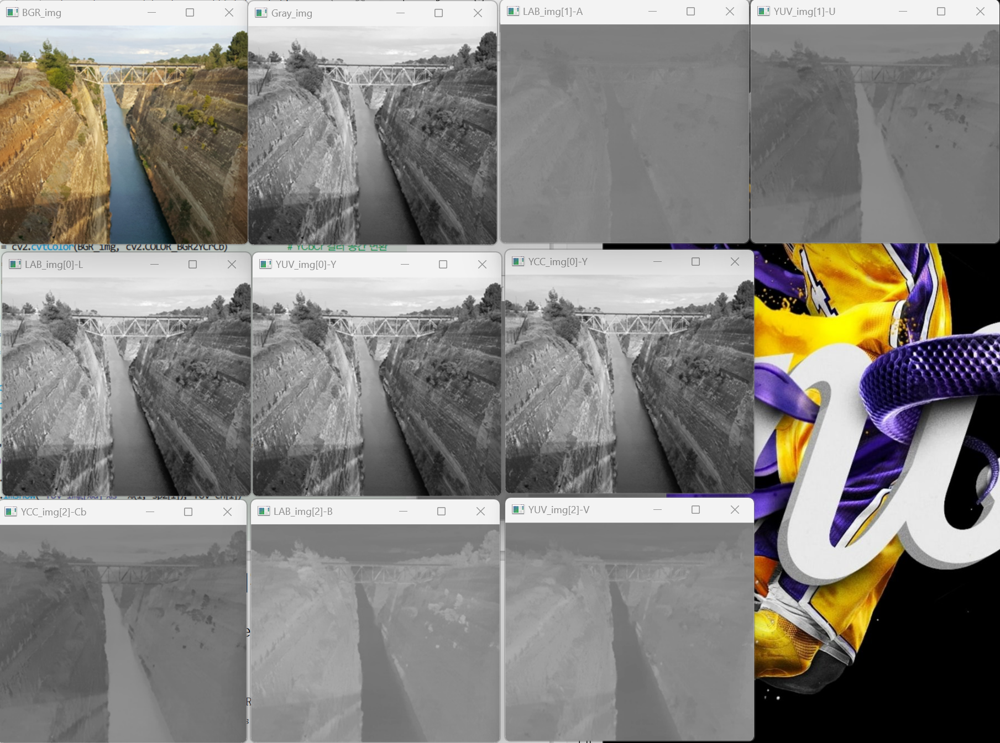

In [45]:
import cv2

thresh_list = [cv2.THRESH_BINARY, cv2.THRESH_BINARY_INV, cv2.THRESH_TOZERO, cv2.THRESH_TOZERO_INV]

def onThreshold(value):
    result = cv2.threshold(image, value, 255, cv2.THRESH_TOZERO)[1]
    cv2.imshow("result", result)

image = cv2.imread("./chap06/images/color_space.jpg", 
cv2.IMREAD_GRAYSCALE) # 컬러 영상 읽기
if image is None: raise Exception("영상 파일 읽기 오류")

cv2.namedWindow("result")
cv2.createTrackbar("threshold", "result", 128, 255, onThreshold)
onThreshold(128) # 이진화 수행

cv2.imshow("image", image)
cv2.waitKey(0) 
cv2.destroyAllWindows()

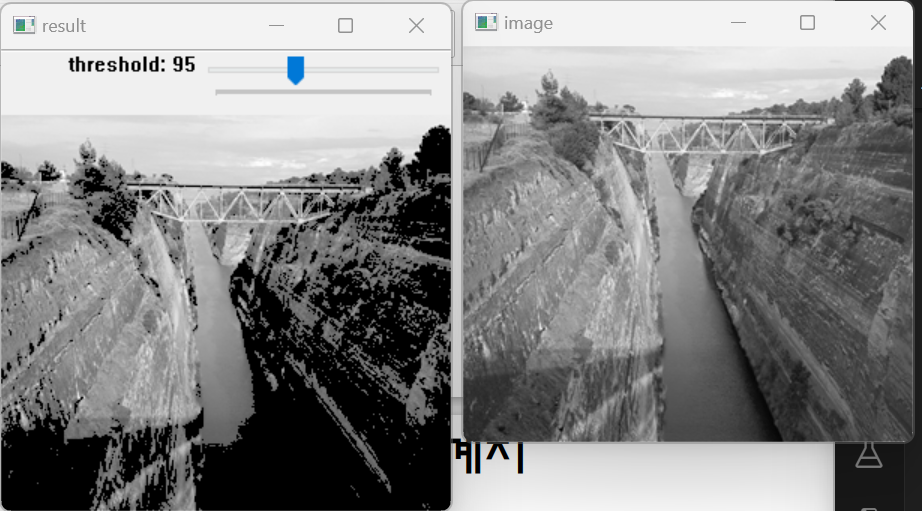

In [49]:
import numpy as np, cv2

def onThreshold(value):
    th[0] = cv2.getTrackbarPos("Hue_th1", "result")
    th[1] = cv2.getTrackbarPos("Hue_th2", "result")

    _, result = cv2.threshold(hue, th[1], 255, cv2.THRESH_TOZERO_INV)
    cv2.threshold(result, th[0], 255, cv2.THRESH_BINARY, result)
    cv2.imshow("result", result)

BGR_img = cv2.imread("./chap06/images/color_space.jpg", cv2.IMREAD_COLOR) # 컬러 영상 읽기
if BGR_img is None: raise Exception("영상 파일 읽기 오류")

HSV_img = cv2.cvtColor(BGR_img, cv2.COLOR_BGR2HSV)  # 컬러공간 변환
hue = np.copy(HSV_img[:,:, 0])                      # hue 행렬에 색상 채널 복사

th = [50, 100]          # 트랙바로 선택할 범위 변수
cv2.namedWindow("result")
cv2.createTrackbar("Hue_th1", "result", th[0], 255, onThreshold)
cv2.createTrackbar("Hue_th2", "result", th[1], 255, onThreshold)
onThreshold(th[0])  # 이진화 수행

cv2.imshow("BGR_img", BGR_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:866: error: (-215:Assertion failed) trackbar in function 'cv::getTrackbarPos'


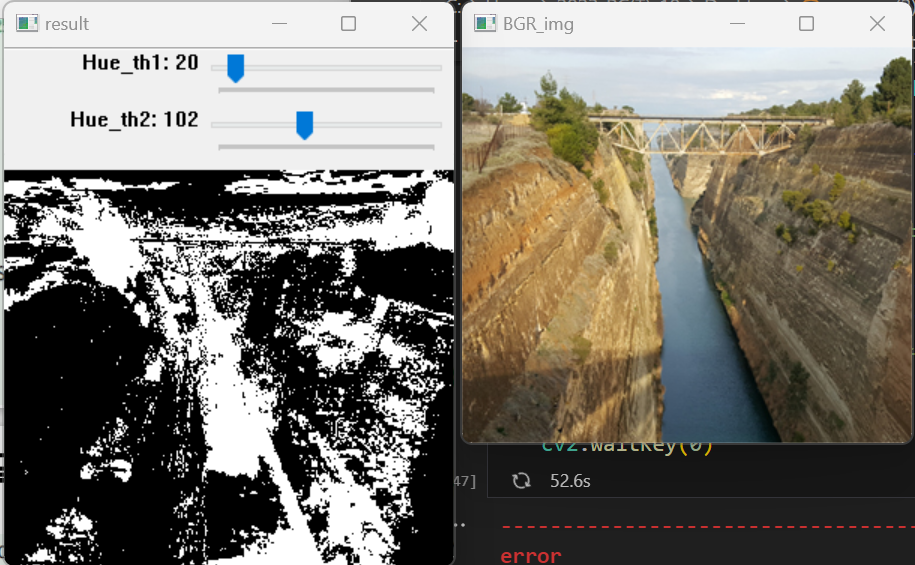

## 연습문제2
지난 문제에서 두 개의 트랙바를 추가해서 각 영상의 반영 비율을 조절할 수 있도록 수정하시오

In [59]:
import numpy as np
import cv2

# 이미지 파일 읽기
image1 = cv2.imread("./chap06/images/add1.jpg", cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread("./chap06/images/add2.jpg", cv2.IMREAD_GRAYSCALE)
if image1 is None or image2 is None:
    raise Exception("영상 파일 읽기 오류 발생")

# 초기 alpha와 beta 값 설정
initial_alpha, initial_beta = 0.5, 0.5

# 트랙바 초기값 설정 (0 ~ 10 사이의 값)
alpha_max = 100
beta_max = 100

# 트랙바 이벤트 핸들러 함수
def on_trackbar_alpha(val):
    global alpha
    alpha = val / alpha_max
    update_image()

def on_trackbar_beta(val):
    global beta
    beta = val / beta_max
    update_image()

# 초기화
cv2.namedWindow('Combined Images')

# 트랙바 생성
cv2.createTrackbar('image1', 'Combined Images', int(0.5 * alpha_max), alpha_max, on_trackbar_alpha)
cv2.createTrackbar('image2', 'Combined Images', int(0.5 * beta_max), beta_max, on_trackbar_beta)

# 이미지 합성 함수
def update_image():
    global alpha, beta, image1, image2
    add_img = cv2.addWeighted(image1, alpha, image2, beta, 0)
    add_img = np.clip(add_img, 0, 255).astype("uint8")

    # 이미지 가로로 합치기
    combined_images = np.hstack((image1, add_img, image2))

    # 이미지 창에 표시
    cv2.imshow('Combined Images', combined_images)

# 초기 이미지 표시
update_image()

# 키 이벤트 대기
cv2.waitKey(0)
cv2.destroyAllWindows()


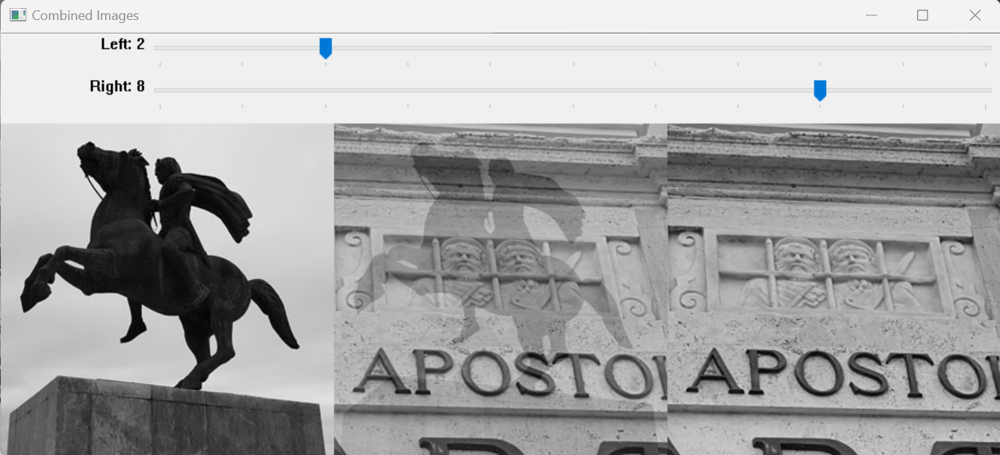